# ***Import the Libraries***

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, mean_absolute_error,plot_roc_curve,roc_curve,roc_auc_score

import warnings
warnings.filterwarnings('ignore')

In [ ]:
#  Plotly for EDA

import plotly.io as pio
import plotly.graph_objects as go
from plotly.figure_factory import create_distplot

pio.templates["draft"] = go.layout.Template(
    layout_annotations=[
        dict(
            textangle=-30,
            opacity=0.1,
            font=dict(color="black", size=100),
            xref="paper",
            yref="paper",
            x=0.5,
            y=0.5,
            showarrow=False,
        )
    ]
)
pio.templates.default = "draft"

# ***Reading Dataset***

In [ ]:
df = pd.read_csv('/content/Social_Network_Ads_event.csv')

In [ ]:
# Preview of dataset
df.head()

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0


In [ ]:
# Shape of the dataset after dropping User_ID feature
df.shape

(400, 3)

In [ ]:
# dtypes of features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Age              400 non-null    int64
 1   EstimatedSalary  400 non-null    int64
 2   Purchased        400 non-null    int64
dtypes: int64(3)
memory usage: 9.5 KB


In [ ]:
# Summary
df.describe()

,Age,EstimatedSalary,Purchased
count,400.000000,400.000000,400.000000
mean,37.655000,69742.500000,0.357500
std,10.482877,34096.960282,0.479864
min,18.000000,15000.000000,0.000000
25%,29.750000,43000.000000,0.000000
50%,37.000000,70000.000000,0.000000
75%,46.000000,88000.000000,1.000000
max,60.000000,150000.000000,1.000000


In [ ]:
# checking for null values
df.isna().sum()

Age                0
EstimatedSalary    0
Purchased          0
dtype: int64

# ***EDA : Exploratory Data Analysis***

## ***Taget Variable : Purchased***

In [ ]:
# Plotting Histogram for Purchased column

fig = go.Figure()

fig.add_trace(go.Histogram(x=df['Purchased'], histfunc='count', marker_color='#330C73'))

fig.update_layout(title="Target Variable Countplot",
                  xaxis_title="Purchased",
                  yaxis_title="Count",
                  bargap=0.5)

fig.show()

In [ ]:
# Plottting Pie chart for Purchased column
fig = go.Figure()
fig.add_trace(go.Pie(labels=df['Purchased'].value_counts().index, values=df['Purchased'].value_counts().values,
                     pull=[0.2, 0], textfont=dict(size=16)))

fig.update_layout(title="Target Variable Pie Plot",
                 annotations=[dict(text='Purchased', x=0.45, y=0.65, font_size=14, showarrow=True)])


fig.show()

# ***EDA -Independent Variables***

In [ ]:
# Plotting Histogram for Age and Estmated Salary features/ columns

fig = go.Figure()

fig.add_trace(go.Histogram(x=df['Age'], histfunc='count', marker_color='#330C73'))
fig.add_trace(go.Histogram(x=df['EstimatedSalary'], histfunc='count', marker_color='#330C73', visible=False))
fig.update_layout(title="Title Will be Updated Once You Select a Feature from the Left Button !")

buttons = [dict(method="update", 
                label="Age",
                args=[{"type":"histogram", "x":[df["Age"]]},
                      {"title":"Age Histogram", "xaxis.title":"Age"}]),
          dict(method="update", 
                label="Estimated Salary",
                args=[{"type":"histogram", "x":[df["EstimatedSalary"]]},
                     {"title":"Estimated Salary Histogram", "xaxis.title":"Estimated Salary"}])]

fig.update_layout(updatemenus=[{"buttons":buttons, "active":0,"showactive":False, "direction":"down", 'x':0.1, 'y':1.2}],
                  xaxis_title="Age",
                  yaxis_title="Count",
                  bargap=0.05)

fig.show()

In [ ]:
# Plotting box plot for Age and Estimated Salary
fig = go.Figure()

fig.add_trace(go.Box(y=df['Age'], marker_color='indianred', boxmean='sd' ,name=""))
fig.add_trace(go.Box(y=df['EstimatedSalary'], visible=False))
fig.update_layout(title="Title Will be Updated Once You Select a Feature from the Left Button !")

buttons = [dict(method="update", 
                label="Age",
                args=[{"type":"box", "y":[df["Age"]], "boxes.name":""},
                      {"title":"Age Boxplot", "xaxis.title":"Age"}]),
          dict(method="update", 
                label="Estimated Salary",
                args=[{"type":"box", "y":[df["EstimatedSalary"]], "boxes.name":""},
                     {"title":"Estimated Salary Boxplot", "xaxis.title":"Estimated Salary"}])]

fig.update_layout(updatemenus=[{"buttons":buttons, "active":0,"showactive":False, "direction":"down", 'x':0.1, 'y':1.2}],
                  xaxis_title="Age",
                  yaxis_title="Count",
                  bargap=0.05)

fig.show()

In [ ]:
# Plotting Histogram for Age and Estimated salary w.r.t target variable (Purchased)

fig = go.Figure()

x0, x1 = df.loc[df.Purchased==0, 'Age'].to_numpy(), df.loc[df.Purchased==1, 'Age'].to_numpy()
x2, x3 = df.loc[df.Purchased==0, 'EstimatedSalary'].to_numpy(), df.loc[df.Purchased==1, 'EstimatedSalary'].to_numpy()
fig.add_trace(go.Histogram(x=x0, histfunc='count', name="Not Purchased", visible=True))
fig.add_trace(go.Histogram(x=x1, histfunc='count', name="Purchased", visible=True))
fig.add_trace(go.Histogram(x=x2, histfunc='count', name="Not Purchased", visible=False))
fig.add_trace(go.Histogram(x=x3, histfunc='count', name="Purchased", visible=False))
fig.update_layout(title="Title Will be Updated Once You Select a Feature from the Left Button !")


buttons = [dict(method="update", label="Age",
               args=[{"x":[x0,x1], "type":"histogram"}, {"title":"Age Histograms Over Purchased", "xaxis.title":"Age"}]),
          dict(method="update", label="Estimated Salary",
               args=[{"x":[x2,x3], "type":"histogram"}, {"title":"Estimated Salary Histograms Over Purchased", "xaxis.title":"Estimated Salary"}])]

fig.update_layout(updatemenus=[{"buttons":buttons, "active":0, "showactive":False, "direction":"down", 'x':0.1, 'y':1.2}])

fig.show()

In [ ]:
# Box plot for AGe w.r.t Purchased feature
fig = go.Figure()
fig.add_trace(go.Box(y=x0, marker_color='lightgreen', boxmean='sd' ,name="Not Purchased"))
fig.add_trace(go.Box(y=x1, marker_color='darkgreen', boxmean='sd' ,name="Purchased"))

fig.update_layout(title="Age Boxplots Over Purchased", yaxis_title="Age")

fig.show()

In [ ]:
# Box plot for Estimated Salary w.r.t Purchased
fig = go.Figure()

fig.add_trace(go.Box(y=x2, marker_color='lightgreen', boxmean='sd' ,name="Not Purchased"))
fig.add_trace(go.Box(y=x3, marker_color='darkgreen', boxmean='sd' ,name="Purchased"))

fig.update_layout(title="Estimated Salary Boxplots Over Purchased", yaxis_title="Estimated Salary")

fig.show()

# ***Scaling and Spiliting the Data***

In [ ]:
# Defining Independent and Dependent Variables
X = df.drop('Purchased', axis = 1)
Y = df['Purchased']

In [ ]:
# Checking the Independent Variables
X.head()

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000


In [ ]:
# Scaling the Input Variable and Spliting train and test sets
scale=StandardScaler()
scale.fit(X)
D=scale.transform(X)
X_train, X_test, Y_train, Y_test = train_test_split(D,Y, test_size=0.20,random_state=300)


In [ ]:
X_train.shape

(320, 2)

In [ ]:
Y_test.shape

(80,)

# ***Building ML Models***

## ***Decision Tree Classifier***

In [ ]:
# Decision tree
DC = DecisionTreeClassifier(max_depth=1)

In [ ]:
# Fitting the model
DC.fit(X_train,Y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=1, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
# Model Prediction
DC_pred = DC.predict(X_test)

[Text(167.4, 163.07999999999998, 'X[0] <= 0.463\ngini = 0.464\nsamples = 320\nvalue = [203, 117]'),
 Text(83.7, 54.360000000000014, 'gini = 0.28\nsamples = 226\nvalue = [188, 38]'),
 Text(251.10000000000002, 54.360000000000014, 'gini = 0.268\nsamples = 94\nvalue = [15, 79]')]

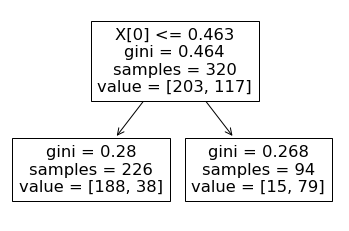

In [ ]:
# Visualisation of tree
tree.plot_tree(DC)

Here we can make this tree more interceptable by adding the features and class names

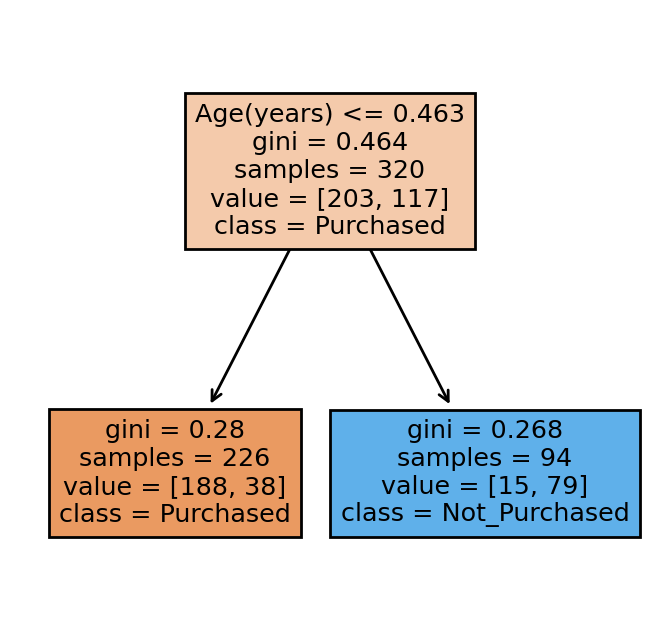

In [ ]:
#  labeling the tree to get better picture about the feature spiliting

fn=['Age(years)','Estimated_Salary (in dollars)']
cn=['Purchased','Not_Purchased']

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=200)
tree.plot_tree(DC,
               feature_names = fn,
               class_names = cn,
               filled = True);
fig.savefig('imagename.png')

In [ ]:
# Permance Metrices
DC_accuracy = accuracy_score(Y_test,DC_pred)
DC_accuracy


0.8625

In [ ]:
pd.DataFrame({"Actual Value":Y_test,"Predicted Value":DC_pred}).head()

,Actual Value,Predicted Value
170,0,0
67,0,0
395,1,1
276,0,0
231,0,0


In [ ]:
# Performance Metrics
print(confusion_matrix(Y_test,DC_pred))
print(classification_report(Y_test,DC_pred))

[[51  3]
 [ 8 18]]
              precision    recall  f1-score   support

           0       0.86      0.94      0.90        54
           1       0.86      0.69      0.77        26

    accuracy                           0.86        80
   macro avg       0.86      0.82      0.83        80
weighted avg       0.86      0.86      0.86        80



## ***Random Forest Classifier***

In [ ]:
# Defining number of trees to be formed usingn_estimators
RF = RandomForestClassifier(n_estimators=500)

In [ ]:
# Fitting the model
RF.fit(X_train,Y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
# Model Predictions
RF_pred = RF.predict(X_test)

In [ ]:
# Checking the details of trees formed
RF.estimators_

[DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                        max_depth=None, max_features='auto', max_leaf_nodes=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=1, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, presort='deprecated',
                        random_state=1269218608, splitter='best'),
 DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                        max_depth=None, max_features='auto', max_leaf_nodes=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=1, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, presort='deprecated',
                        random_state=363915207, splitter='best'),
 DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                        max_depth=None, m

In [ ]:
print(len(RF.estimators_))

500


In [ ]:
# Visualisation of tree in Random forest

fn=['Age(years)','Estimated_Salary (in dollars)']
cn=['Purchased','Not_Purchased']

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=3000)
tree.plot_tree(RF.estimators_[0],
               feature_names = fn,
               class_names = cn,
               filled = True);
fig.savefig('imagename.png')



In [ ]:
# Printing the trees in Random Forest
fn=['Age(years)','Estimated_Salary (in dollars)']
cn=['Purchased','Not_Purchased']

fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(RF.estimators_[index],
                   feature_names = fn, 
                   class_names=cn,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('rf_5trees.png')

In [ ]:
# Performance Metrices
RF_accuracy = accuracy_score(Y_test,RF_pred)
RF_accuracy

0.9375

In [ ]:
pd.DataFrame({"Actual Value":Y_test,"Predicted Value":RF_pred}).head()

,Actual Value,Predicted Value
170,0,0
67,0,0
395,1,1
276,0,0
231,0,0


In [ ]:
print(confusion_matrix(Y_test,RF_pred))
print(classification_report(Y_test,RF_pred))

[[50  4]
 [ 1 25]]
              precision    recall  f1-score   support

           0       0.98      0.93      0.95        54
           1       0.86      0.96      0.91        26

    accuracy                           0.94        80
   macro avg       0.92      0.94      0.93        80
weighted avg       0.94      0.94      0.94        80



## ***Logistic Regression***

In [ ]:
#Fitting the model

LR =LogisticRegression(solver='liblinear')
LR.fit(X_train,Y_train)

# Model Predictions
LR_pred=LR.predict(X_test)
LR_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0])

In [ ]:
# Accuracy Score
LR_accuracy = accuracy_score(Y_test,LR_pred)
LR_accuracy

0.8625

In [ ]:
pd.DataFrame({"Actual Value":Y_test,"Predicted Value":LR_pred}).head()

,Actual Value,Predicted Value
170,0,0
67,0,0
395,1,0
276,0,0
231,0,0


In [ ]:
# CLassification Report
print(classification_report(Y_test,LR_pred))

              precision    recall  f1-score   support

           0       0.86      0.94      0.90        54
           1       0.86      0.69      0.77        26

    accuracy                           0.86        80
   macro avg       0.86      0.82      0.83        80
weighted avg       0.86      0.86      0.86        80



##***K Nearest Neighbors***

In [ ]:
knn = KNeighborsClassifier(n_neighbors=10)

In [ ]:
# Fitting the model
knn.fit(X_train,Y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                     weights='uniform')

In [ ]:
# Model Predictions
Knn_pred = knn.predict(X_test)

In [ ]:
pd.DataFrame({"Actual Value":Y_test,"Predicted Value":Knn_pred}).head()

,Actual Value,Predicted Value
170,0,0
67,0,0
395,1,1
276,0,0
231,0,0


In [ ]:
# Performance Metrics
print(confusion_matrix(Y_test,Knn_pred))
print(classification_report(Y_test,Knn_pred))

[[51  3]
 [ 2 24]]
              precision    recall  f1-score   support

           0       0.96      0.94      0.95        54
           1       0.89      0.92      0.91        26

    accuracy                           0.94        80
   macro avg       0.93      0.93      0.93        80
weighted avg       0.94      0.94      0.94        80



In [ ]:
# Accuracy Score
Knn_accuracy = accuracy_score(Y_test,Knn_pred)
Knn_accuracy

0.9375

##***Support Vector Machine***

In [ ]:
# Fitting the Model
SVM = SVC()
SVM.fit(X_train, Y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
# Model Predictions
SVC_pred = SVM.predict (X_test)

In [ ]:
pd.DataFrame({"Actual Value":Y_test,"Predicted Value":SVC_pred}).head()

,Actual Value,Predicted Value
170,0,0
67,0,0
395,1,1
276,0,0
231,0,0


In [ ]:
# Classification Report and Confusion Matrix
print(confusion_matrix(Y_test,SVC_pred))
print(classification_report(Y_test,SVC_pred))

[[51  3]
 [ 0 26]]
              precision    recall  f1-score   support

           0       1.00      0.94      0.97        54
           1       0.90      1.00      0.95        26

    accuracy                           0.96        80
   macro avg       0.95      0.97      0.96        80
weighted avg       0.97      0.96      0.96        80



In [ ]:
# Accurcy Score
SVC_accuracy = accuracy_score(Y_test,SVC_pred)
SVC_accuracy

0.9625

In [ ]:
# Creating an empty list to append all the values of accuracy scores
models = []
models.append(('Random Forest',RF_accuracy*100))
models.append(('Decision Tree',DC_accuracy*100))
models.append(('Support Vector Machine',SVC_accuracy*100))
models.append(('KNN',Knn_accuracy*100))
models.append(('Logistic Regression',LR_accuracy*100))
models

[('Random Forest', 93.75),
 ('Decision Tree', 86.25),
 ('Support Vector Machine', 96.25),
 ('KNN', 93.75),
 ('Logistic Regression', 86.25)]

###Here SVM has the highest Accuracy or best performing model for this particular dataset.

# ***ROC and AUC***

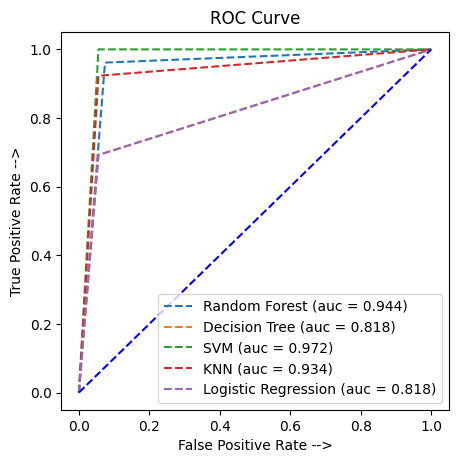

In [ ]:
from sklearn.metrics import auc 


# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(Y_test))]
p_fpr, p_tpr, _ = roc_curve(Y_test, random_probs, pos_label=1)

# Calculating the AUC for all model (TPR- True Positive Rate, FPR- False Positive Rate)

# Random Forest
RF_fpr, RF_tpr, threshold = roc_curve(Y_test,RF_pred)
auc_RF = auc(RF_fpr, RF_tpr)

# Decision Tree
DC_fpr, DC_tpr, threshold = roc_curve(Y_test,DC_pred)
auc_DC = auc(DC_fpr, DC_tpr)

# Logistic Regression
LR_fpr, LR_tpr, threshold = roc_curve(Y_test,LR_pred)
auc_LR = auc(LR_fpr, LR_tpr)

# KNN
knn_fpr, knn_tpr, threshold = roc_curve(Y_test,Knn_pred)
auc_knn = auc(knn_fpr, knn_tpr)

# Support Vector Machine
svm_fpr, svm_tpr, threshold = roc_curve(Y_test,SVC_pred)
auc_svm = auc(svm_fpr, svm_tpr)

# Plotting the ROC Curve
plt.figure(figsize=(5, 5), dpi=100)
plt.plot(RF_fpr, RF_tpr, linestyle='--', label='Random Forest (auc = %0.3f)' % auc_RF)
plt.plot(DC_fpr, DC_tpr, linestyle='--', label='Decision Tree (auc = %0.3f)' % auc_DC)
plt.plot(svm_fpr, svm_tpr, linestyle='--', label='SVM (auc = %0.3f)' % auc_svm)
plt.plot(knn_fpr, knn_tpr, linestyle='--', label='KNN (auc = %0.3f)' % auc_knn)
plt.plot(LR_fpr, LR_tpr, linestyle='--', label='Logistic Regression (auc = %0.3f)' % auc_LR)

plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')

plt.title('ROC Curve')

plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')

plt.legend()

plt.show()


Higher the AUC value better the model performance, if your model ROC curve comes under the linear line it means model is not good.

Note: Plotly EDA are boiler plate codes which can be used for any dataset with customization.